CALIFORNIA HOUSING PRICES MACHINE LEARNING PROBLEM

Download the Data and Import Packages

In [15]:
import os
import tarfile
import urllib
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
import geopandas as gpd
from shapely.geometry import Point
import pyproj

def load_housing_data(csvname): 
    return pd.read_csv(csvname)

housing = load_housing_data('housing.csv')

Steps taken in building a model:
1. Explore data for anomilies and general info
2. Create test set using some kind of smapling technique
3. Data visualization
4. Looking for correlations
5. Exploring attribute combinations
6. Preparing data for machine learning algorithms

Exploring the Data

   longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0    -122.23     37.88                41.0        880.0           129.0   
1    -122.22     37.86                21.0       7099.0          1106.0   
2    -122.24     37.85                52.0       1467.0           190.0   
3    -122.25     37.85                52.0       1274.0           235.0   
4    -122.25     37.85                52.0       1627.0           280.0   
5    -122.25     37.85                52.0        919.0           213.0   
6    -122.25     37.84                52.0       2535.0           489.0   
7    -122.25     37.84                52.0       3104.0           687.0   
8    -122.26     37.84                42.0       2555.0           665.0   
9    -122.25     37.84                52.0       3549.0           707.0   

   population  households  median_income  median_house_value ocean_proximity  
0       322.0       126.0         8.3252            452600.0        NEAR BAY  
1      2401.0   

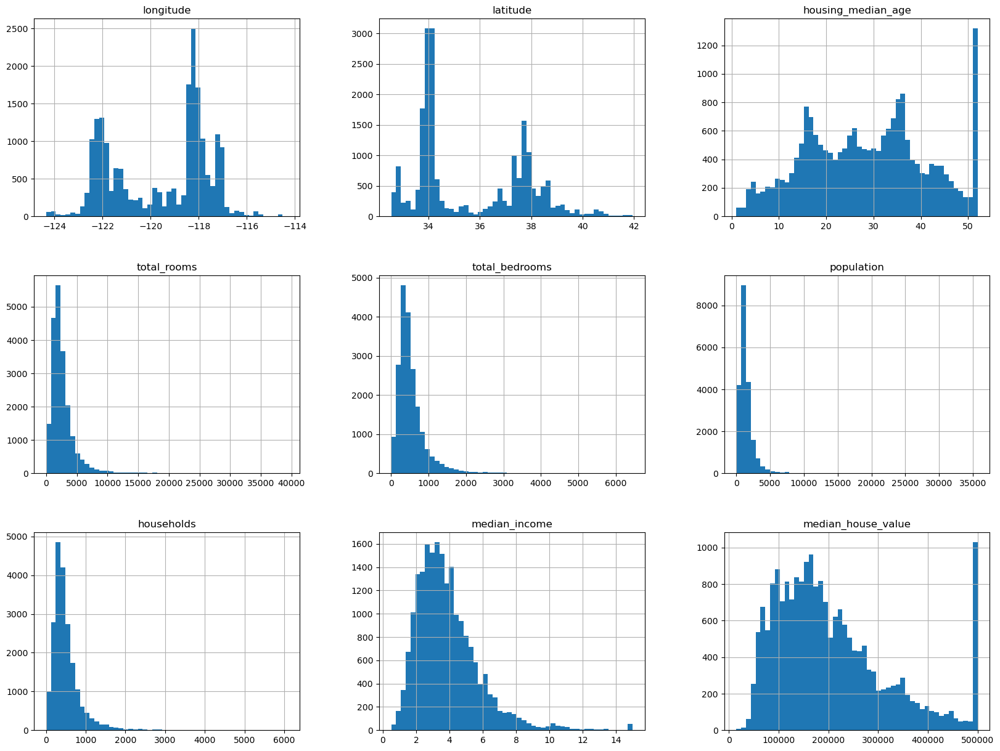

In [16]:
# data types and variables
print(housing.head(10))
print(housing.info())

# exploring variables
housing['ocean_proximity'].value_counts()
housing.describe()
housing.hist(bins = 50, figsize = (20, 15))

# creating test set using stratified random sampling. because data set is small, we want a representative sample 
# when it comes to median income. random sampling may lead to some bias.
housing['income_cat'] = pd.cut(housing['median_income'],
                               bins = [0., 1.5, 3.0, 4.5, 6., np.inf],
                               labels = [1, 2, 3, 4, 5])

split = StratifiedShuffleSplit(n_splits = 1, test_size = 0.2, random_state = 42)
for train_index, test_index in split.split(housing, housing['income_cat']):
    strat_train_set = housing.loc[train_index]
    strat_test_set = housing.loc[test_index]

# drop new category we created to do stratified random sampling
for set_ in (strat_train_set, strat_test_set):
    set_.drop('income_cat', axis = 1, inplace = True)

# create a geodataframe
geometry = [Point(xy) for xy in zip(housing['longitude'], housing['latitude'])]
geo_housing = gpd.GeoDataFrame(housing, geometry=geometry)


Visualizing the Data

/Users/coymorris/miniconda3/envs/geoenv/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


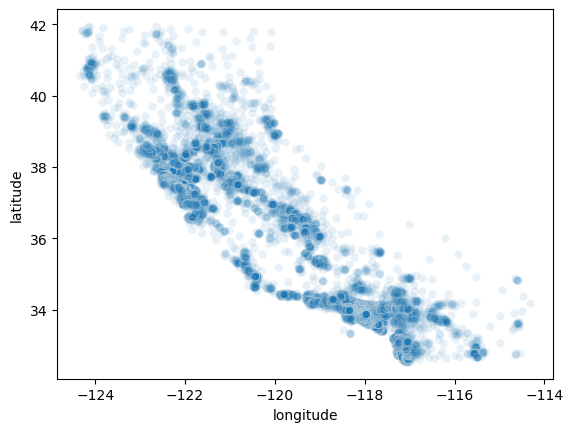

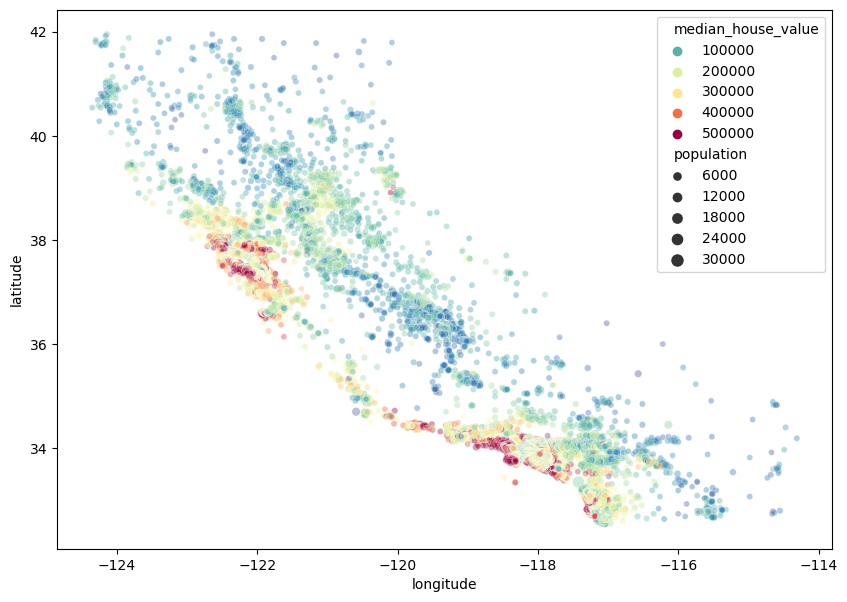

<Figure size 1200x800 with 0 Axes>

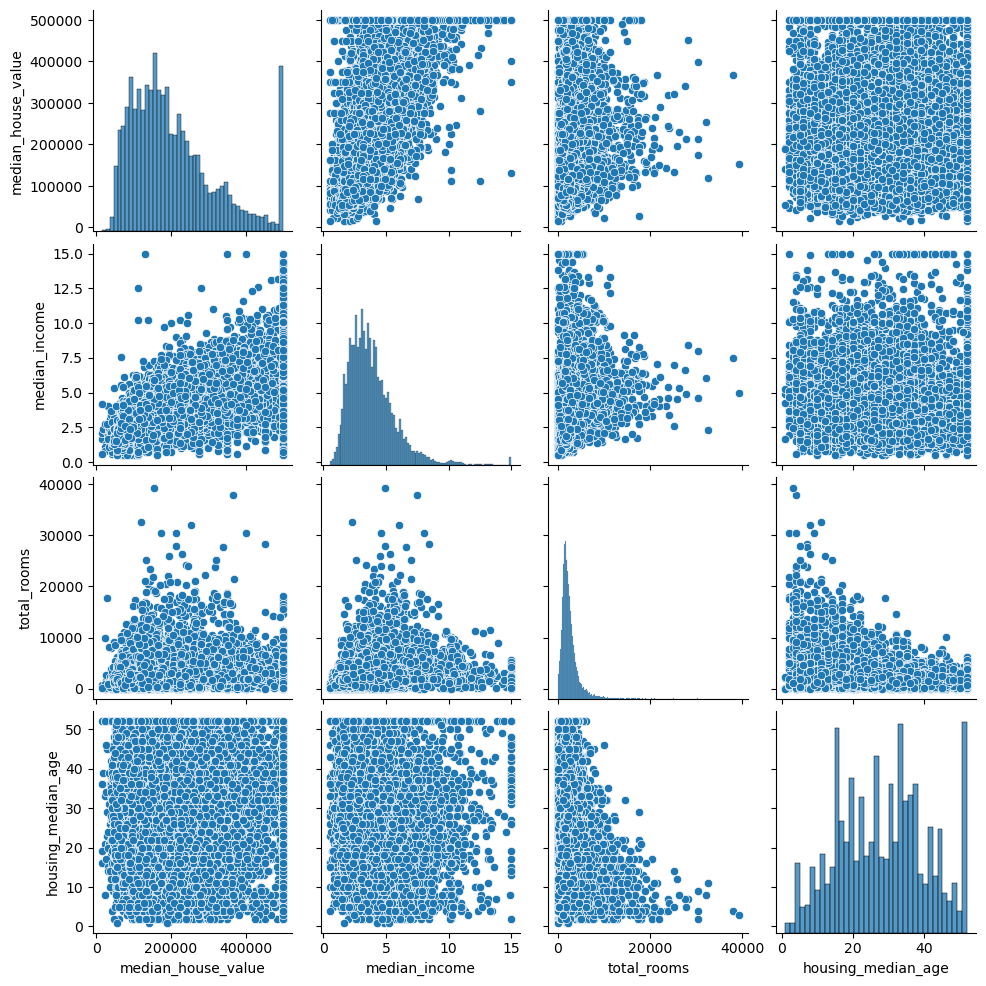

In [17]:
# plotting geographical data with seaborn
sns.scatterplot(data = housing, x = 'longitude', y = 'latitude', alpha = 0.1)

# iteration
plt.figure(figsize=(10, 7))
sns.scatterplot(data = housing, x = 'longitude', y = 'latitude', alpha = 0.4, palette = 'Spectral_r',
                hue = 'median_house_value', size = housing['population'], legend = True)

# correlation graphs
attributes = ["median_house_value", "median_income", "total_rooms", "housing_median_age"]
plt.figure(figsize = (12, 8))
sns.pairplot(data = housing[attributes])

# map
geo_housing = geo_housing.set_crs('epsg:4326')
geo_housing.explore(column = 'median_house_value' , cmap = 'Spectral_r', style_kwds = dict(opacity=0.8, fillOpacity=0.3))

Transforming and Cleaning the Data

In [ ]:
# first let's seperate target values because we do not want to apply tranformations to predicted values
housing = strat_train_set.drop("median_house_value", axis=1)
housing_labels = strat_train_set["median_house_value"].copy()

# dealing with na values
housing.isna().sum()

# lets impute the missing values in total bedrooms
from sklearn.impute import SimpleImputer
'''
imputer = SimpleImputer(strategy = 'median')

housing_num = housing.drop('ocean_proximity', axis = 1)

imputer.fit(housing_num)
X = imputer.transform(housing_num)
housing_tr = pd.DataFrame(X, columns = housing_num.columns, index = housing_num.index)
'''
# this is good, but lets create a pipeline that does this and column encoding at once.
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

num_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy="median")),
        ('std_scaler', StandardScaler()),
        ])

num_attribs = list(housing_num)
cat_attribs = ["ocean_proximity"]
     
full_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attribs),
        ("cat", OneHotEncoder(), cat_attribs),
    ])

housing_prepared = full_pipeline.fit_transform(housing)

Model Selection and Execution

In [47]:
from sklearn.linear_model import LinearRegression

# initiate model and fit to data
lin_reg = LinearRegression()
lin_reg.fit(housing_prepared, housing_labels)

# test model on some of the data
some_data = housing[:5]
some_labels = housing_labels[:5]
some_data_prepared = full_pipeline.transform(some_data)
# print('Predictions: ', lin_reg.predict(some_data_prepared))
# print('Labels: ', list(some_labels))

# predictions on this small set are pretty off
# measure our accuracy of the predictions on whole data set
from sklearn.metrics import mean_squared_error

housing_predictions = lin_reg.predict(housing_prepared)
lin_mse = mean_squared_error(housing_labels, housing_predictions)
lin_rmse = np.sqrt(lin_mse)
print('Linear RMSE: ', lin_rmse)

# simple linear regression is not performing very well, lets try a decision tree regression
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(housing_prepared, housing_labels)

housing_predictions = tree_reg.predict(housing_prepared)
tree_mse = mean_squared_error(housing_labels, housing_predictions)
tree_rmse = np.sqrt(tree_mse)
print('Tree RMSE: ', tree_rmse)

# this cannot be right, model must be overfitting
from sklearn.model_selection import cross_val_score

# lets check linear scores first

def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

lin_scores = cross_val_score(lin_reg, housing_prepared, housing_labels,
                             scoring = 'neg_mean_squared_error', cv = 10)

lin_rmse_scores = np.sqrt(-lin_scores)

print('')
print('Linear validation scores: ')
print('')
display_scores(lin_rmse_scores)

# then decision tree scores

scores = cross_val_score(tree_reg, housing_prepared, housing_labels,
                             scoring="neg_mean_squared_error", cv=10)

tree_rmse_scores = np.sqrt(-scores)

print('')
print('Tree validation scores: ')
print('')
display_scores(tree_rmse_scores)
print('')

# both perform pretty poorly; let's try one more model and perform cross validation

from sklearn.ensemble import RandomForestRegressor

random_forest_reg = RandomForestRegressor()
random_forest_reg.fit(housing_prepared, housing_labels)

housing_predictions = random_forest_reg.predict(housing_prepared)
forest_mse = mean_squared_error(housing_labels, housing_predictions)
forest_rmse = np.sqrt(forest_mse)
print('Forest RMSE: ', forest_rmse)

forest_scores = cross_val_score(random_forest_reg, housing_prepared, housing_labels,
                                scoring = 'neg_mean_squared_error', cv = 10)

forest_rmse_scores = np.sqrt(-forest_scores)

display_scores(forest_rmse_scores)

Linear RMSE:  69051.39194135115
Tree RMSE:  0.0

Linear validation scores: 

Scores: [72235.53136036 65318.2240289  67708.88970082 69369.64831905
 66761.87759792 72994.9032198  70528.3094242  69440.77896541
 66931.55282849 70756.28022329]
Mean: 69204.59956682265
Standard deviation: 2372.142210765106

Tree validation scores: 

Scores: [71356.70669498 69345.65897771 64711.50929262 68680.68680902
 67763.58370452 67682.04528584 72632.99311493 69737.63084547
 67742.07877848 71378.79082198]
Mean: 69103.1684325559
Standard deviation: 2197.9468255042298

Forest RMSE:  18393.86693378466
Scores: [50911.74934218 49075.59267383 46200.7507771  50266.72357842
 47172.54960162 49241.35868143 51925.58324704 48826.65947983
 47208.15220118 53345.56503929]
Mean: 49417.468462193865
Standard deviation: 2131.657870159869
